<a href="https://colab.research.google.com/github/Basa0006/AI/blob/main/slappertrackerdetectron2withaugmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Set the Colab GPU**

Go to Edit > Notebook settings as the following:

Click on “Notebook settings” and select “GPU” from Hardware *accelerator*. That's it.

**Connect Colab with Google Drive**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!python -m pip install pyyaml==5.1

# Properly install detectron2.
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities
#(e.g. compiled operators).
#(Please do not install twice in both ways)
#!git clone 'https://github.com/facebookresearch/detectron2'
#dist = distutils.core.run_setup("./detectron2/setup.py")
#!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
#sys.path.insert(0, os.path.abspath('./detectron2'))

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 5.3 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-34m3bafk
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-34m3bafk
  Resolved https://github.com/facebookresearch/detectron2.git to commit 3ff5dd1cff4417af07097064813c9f28d7461d3c
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50

In [ ]:
#part of d2go
#!pip install 'git+https://github.com/facebookresearch/mobile-vision.git'

In [ ]:
#part of d2go
#!git clone https://github.com/facebookresearch/d2go

In [ ]:
#part of d2go
#!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu113/torch1.12/index.html
#!pip install fvcore

In [ ]:
#part of d2go
#!pip install pytorch-lightning

In [ ]:
#check that we have the right libraries installed

import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0
torch:  2.1 ; cuda:  cu121
detectron2: 0.6


**Clean Up Libraries**

In [ ]:
# COMMON LIBRARIES
import os
import cv2
import numpy as np
import json, random
import matplotlib.pyplot as plt

from datetime import datetime
from google.colab.patches import cv2_imshow

# DATA SET PREPARATION AND LOADING
from detectron2.data.datasets import register_coco_instances
from detectron2.data import DatasetCatalog, MetadataCatalog

# VISUALIZATION
from detectron2.utils.visualizer import Visualizer
from detectron2.utils.visualizer import ColorMode

# CONFIGURATION
from detectron2 import model_zoo
from detectron2.config import get_cfg

# EVALUATION
from detectron2.engine import DefaultPredictor

# TRAINING
from detectron2.engine import DefaultTrainer

#Setup detectron2 logger
from detectron2.utils.logger import setup_logger
setup_logger()

#part of d2go
#import pytorch_lightning as pl
#from pytorch_lightning.utilities.logger import _flatten_dict
#from pytorch_lightning.callbacks import ModelCheckpoint
#from pytorch_lightning import loggers




<Logger detectron2 (DEBUG)>

In [ ]:
#part of d2go
#os.environ['CUDA_LAUNCH_BLOCKING'] = "1"

**Slapper Tracker Dataset**

In [ ]:
#Define path for slappertracker data

slappertracker_path = '/content/drive/MyDrive/slappertracker/'

In [ ]:
# if your dataset is in COCO format, then write the following three lines:
#this is for items not in the correct format.

from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/drive/My Drive/slappertracker/train/_annotations.coco.json", "/content/drive/My Drive/slappertracker/train") #changed location to wher I have it
register_coco_instances("my_dataset_val", {}, "/content/drive/My Drive/slappertracker/valid/_annotations.coco.json", "/content/drive/My Drive/slappertracker/valid") #changed location to where I have it
register_coco_instances("my_dataset_test", {}, "/content/drive/My Drive/slappertracker/test/_annotations.coco.json", "/content/drive/My Drive/slappertracker/test")



**COCO Dataset**

In [ ]:
train_metadata = MetadataCatalog.get('my_dataset_train')
dataset_dicts = DatasetCatalog.get("my_dataset_train") #need to rename this for train data.

[02/27 18:15:45 d2.data.datasets.coco]: Loading /content/drive/My Drive/slappertracker/train/_annotations.coco.json takes 4.01 seconds.
WARNING [02/27 18:15:45 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[02/27 18:15:45 d2.data.datasets.coco]: Loaded 524 images in COCO format from /content/drive/My Drive/slappertracker/train/_annotations.coco.json


In [ ]:
train_metadata

namespace(name='my_dataset_train',
          json_file='/content/drive/My Drive/slappertracker/train/_annotations.coco.json',
          image_root='/content/drive/My Drive/slappertracker/train',
          evaluator_type='coco',
          thing_classes=['None', 'HP', 'RTB'],
          thing_dataset_id_to_contiguous_id={0: 0, 1: 1, 2: 2})

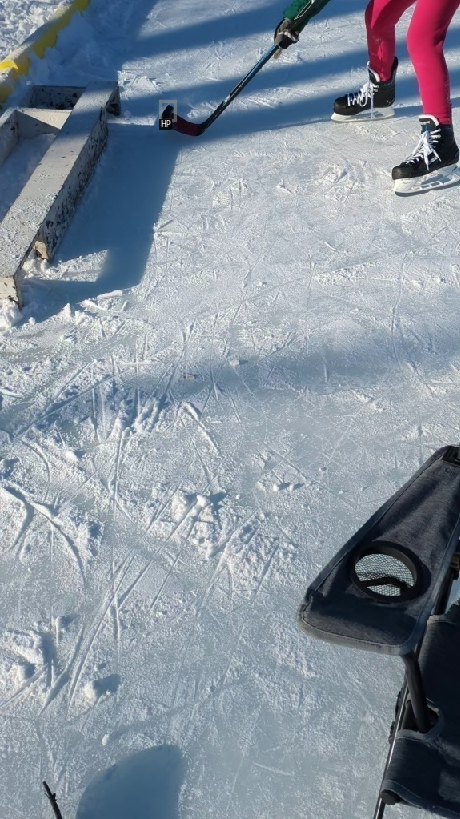

In [ ]:
dataset_entry = dataset_dicts[1]
image = cv2.imread(dataset_entry["file_name"])

visualizer = Visualizer(
    image[:, :, ::-1],
    metadata=train_metadata,
    scale=0.8,
    instance_mode=ColorMode.IMAGE_BW
)

out = visualizer.draw_dataset_dict(dataset_entry)
cv2_imshow(out.get_image()[:, :, ::-1])

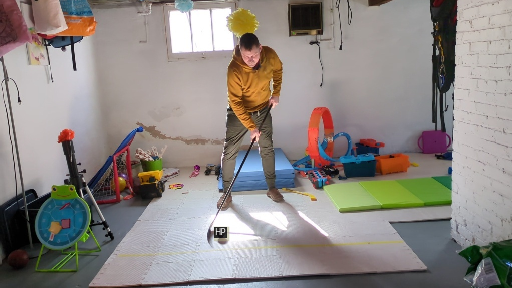

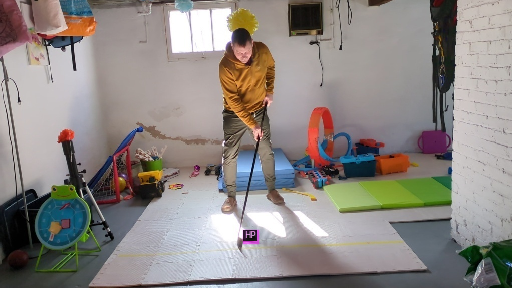

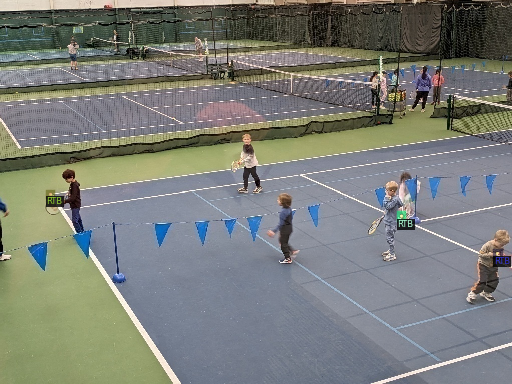

In [ ]:
#/content/drive/MyDrive/slappertracker/train/test.json
#dataset_dicts = get_slappertracker_dicts(slappertracker_path + "train")
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=train_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

# Augmentation Transforms

In [ ]:
from detectron2.data import detection_utils as utils
import detectron2.data.transforms as T
import copy
import torch

def custom_mapper(dataset_dict):
    dataset_dict = copy.deepcopy(dataset_dict)  # it will be modified by code below
    image = utils.read_image(dataset_dict["file_name"], format="BGR")
    transform_list = [
        T.Resize((800,600)),
        T.RandomBrightness(0.8, 1.8),
        T.RandomContrast(0.6, 1.3),
        T.RandomSaturation(0.8, 1.4),
        T.RandomRotation(angle=[90, 90]),
        T.RandomLighting(0.7),
        T.RandomFlip(prob=0.4, horizontal=False, vertical=True),
    ]
    image, transforms = T.apply_transform_gens(transform_list, image)
    dataset_dict["image"] = torch.as_tensor(image.transpose(2, 0, 1).astype("float32"))

    annos = [
        utils.transform_instance_annotations(obj, transforms, image.shape[:2])
        for obj in dataset_dict.pop("annotations")
        if obj.get("iscrowd", 0) == 0
    ]
    instances = utils.annotations_to_instances(annos, image.shape[:2])
    dataset_dict["instances"] = utils.filter_empty_instances(instances)
    return dataset_dict

In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.data import build_detection_test_loader, build_detection_train_loader

class CustomTrainer(DefaultTrainer):
    @classmethod
    def build_train_loader(cls, cfg):
        return build_detection_train_loader(cfg, mapper=custom_mapper)

In [ ]:
#Need to look at this and see what I need to do here.  Looks to be just registering dataset which has already taken place above.

#for d in ["train", "val"]:
#    DatasetCatalog.register("balloon_" + d, lambda d=d: get_balloon_dicts("balloon/" + d))
#    MetadataCatalog.get("balloon_" + d).set(thing_classes=["balloon"])
#balloon_metadata = MetadataCatalog.get("balloon_train")

#for d in ["my_dataset_train", "my_dataset_val"]:
#    DatasetCatalog.register()

# Instance Segmentation and Object Detection with Custom Dataset using Faster R-CNN

In [ ]:
#pickup here***********Whoohoo! on to training.**********************
#code from Udemy course
# https://github.com/facebookresearch/detectron2/tree/main/configs/COCO-InstanceSegmentation

#****Need to tune better****is working but not well.  Add more pictures and increase the iterations from 500 to 2000 and see what happens.  Also, added the validation set to the training.
from detectron2.modeling import build_model

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))#
#("COCO-InstanceSegmentation/Base-RCNN-FPN.yaml")) # was mask_rcnn_R_50_FPN_3x; Base-RCNN-FPN.yaml is a Faster R-CNN model
cfg.DATASETS.TRAIN = ("my_dataset_train",)#Needed paranthesis
cfg.DATASETS.TEST = ("my_dataset_val",) #add a test set here-use validation set and setup test set for the final check.
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")#("COCO-InstanceSegmentation/Base-RCNN-FPN.yaml")  # was mask_rcnn_R_50_FPN_3x initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 5000 #increase this significantly  See what it looks like at 5000.  Was 500
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 3  # Looks like none counts as one of the classes
cfg.OUTPUT_DIR = "/content/drive/My Drive/slappertracker/model" #save model to google drive
#cfg.MODEL.DEVICE='cpu' #set as cpu for pedictions #added 1/27/24 to see if it helps with using on local computer.


#os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
#trainer = DefaultTrainer(cfg)
#trainer.resume_or_load(resume=False)
#trainer.train() #****AttributeError: Cannot find field 'gt_masks' in the given Instances!****Need different model without masks.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CustomTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

#save model to google drive
#model = build_model(cfg) #removed
#model_save_name = 'slappertracker.pth'
#path = F"/content/drive/My Drive/{model_save_name}"
#torch.save(trainer.state_dict(), path) #changed from model to trainer

#torch.save(trainer.model, 'checkpoint.pth')

[02/27 19:08:42 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[02/27 19:08:42 d2.engine.train_loop]: Starting training from iteration 0
[02/27 19:08:59 d2.utils.events]:  eta: 1:06:30  iter: 19  total_loss: 1.606  loss_cls: 1.337  loss_box_reg: 0.03545  loss_rpn_cls: 0.1974  loss_rpn_loc: 0.01193    time: 0.8026  last_time: 0.8065  data_time: 0.0197  last_data_time: 0.0054   lr: 4.9953e-06  max_mem: 3701M
[02/27 19:09:15 d2.utils.events]:  eta: 1:06:43  iter: 39  total_loss: 1.458  loss_cls: 1.2  loss_box_reg: 0.0396  loss_rpn_cls: 0.1517  loss_rpn_loc: 0.01353    time: 0.8068  last_time: 0.8149  data_time: 0.0070  last_data_time: 0.0069   lr: 9.9902e-06  max_mem: 3701M
[02/27 19:09:31 d2.utils.events]:  eta: 1:06:49  iter: 59  total_loss: 1.343  loss_cls: 1.021  loss_box_reg: 0.05635  loss_rpn_cls: 0.1159  loss_rpn_loc: 0.008811    time: 0.8112  last_time: 0.8251  data_time: 0.0073  last_data_time: 0.0082   lr: 1.4985e-05  max_mem: 3701M
[02/27 19:09:48 d2.utils.events]:  eta: 1:06:55  iter: 79  total_loss: 0.9631  loss_cls: 0.7573  loss_box_reg

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [ ]:
#save model config
f = open('config.yaml', 'w')
f.write(cfg.dump())
f.close()

# Inference & evaluation using the trained model

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model #was 0.7
cfg.DATASETS.TEST = ("my_dataset_val", ) #was "balloon_val"
predictor = DefaultPredictor(cfg)

[02/27 20:28:37 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/My Drive/slappertracker/model/model_final.pth ...


WARNING [02/27 20:30:30 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[02/27 20:30:30 d2.data.datasets.coco]: Loaded 97 images in COCO format from /content/drive/My Drive/slappertracker/test/_annotations.coco.json


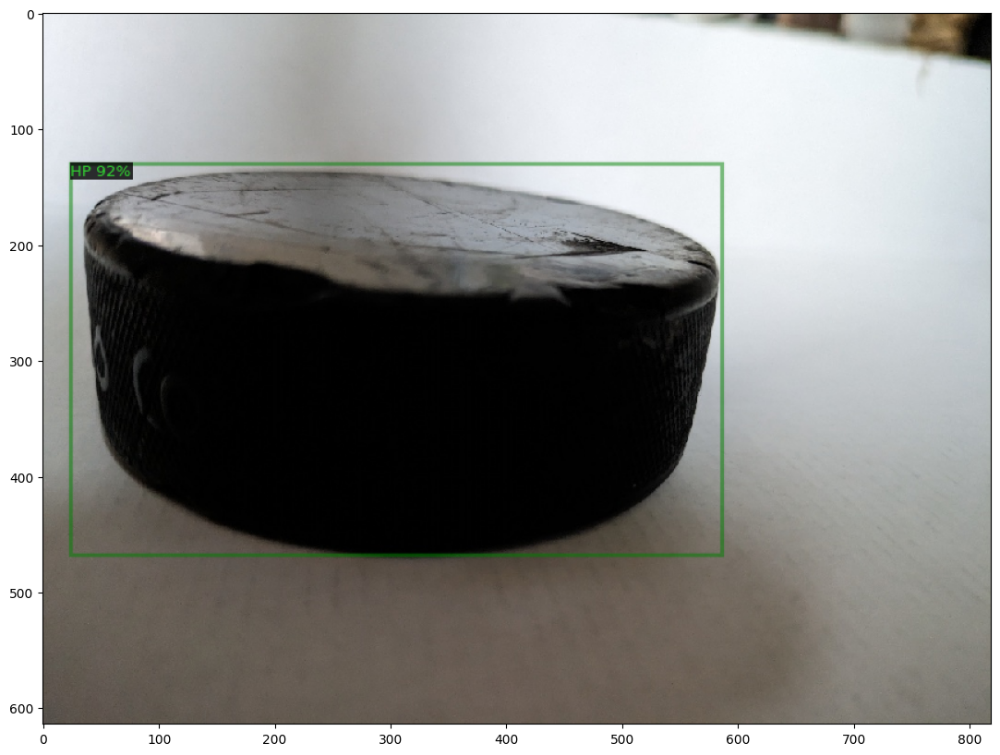

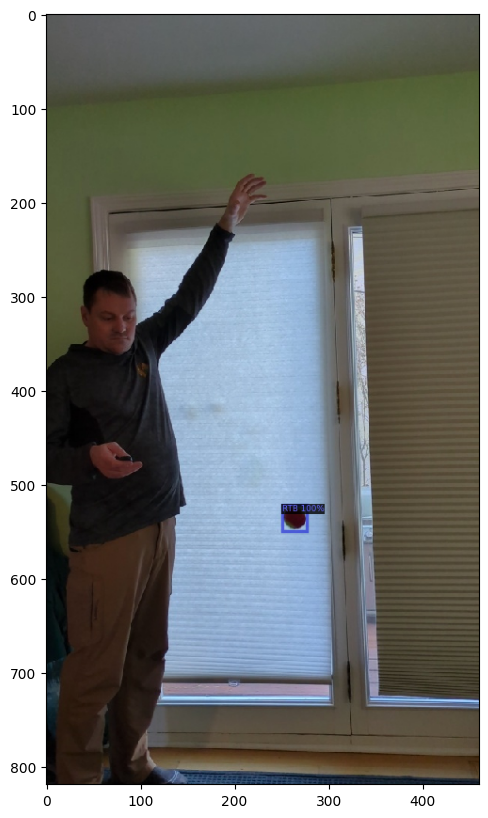

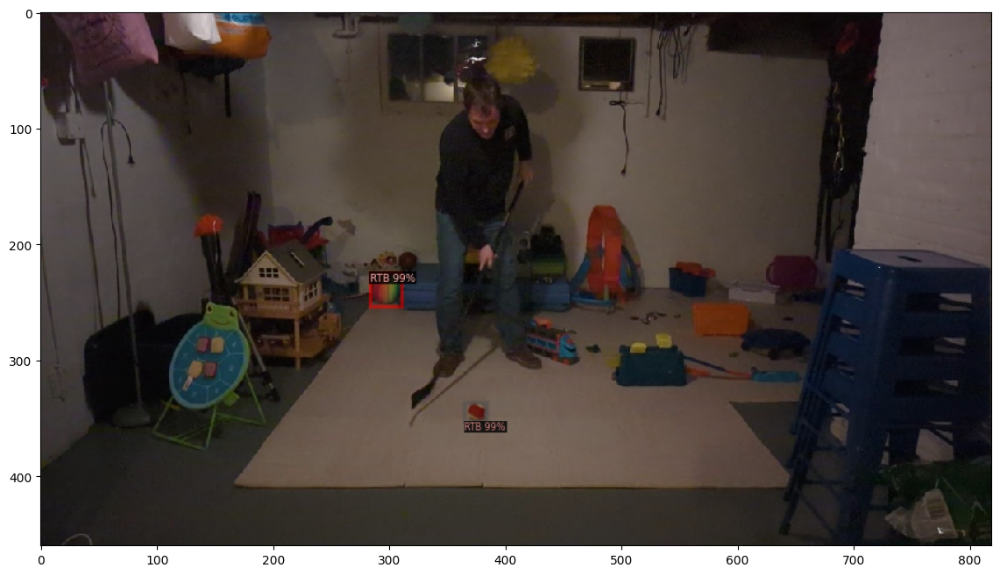

In [ ]:
#need to update with my stuff.  regester validation data as separate dictionary


import random

dataset_dicts_test = DatasetCatalog.get("my_dataset_test") #need to rename this for train data.
test_metadata = MetadataCatalog.get('my_dataset_test')


for d in random.sample(dataset_dicts_test, 3):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1], metadata=test_metadata, scale=0.8)
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()

    #Works great for hockey puck.  Horrible for tennis ball.

# Load trained model

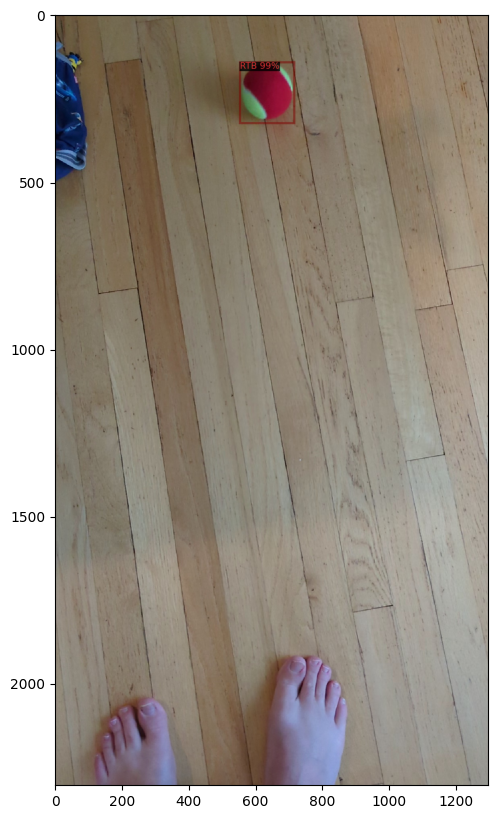

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.2
#random = cv2.imread("/content/drive/My Drive/slappertracker/test/PXL_20231230_160404579.jpg")
#random = cv2.imread("/content/drive/My Drive/PXL_20231203_224541120.TS_exported_13362_1701727399495.jpg")
random = cv2.imread("/content/drive/My Drive/testpics/frame90.jpg")

outputs = predictor(random)

#Visualize results
v = Visualizer(random[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
plt.figure(figsize = (14, 10))
plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))

 **Performance Metric**

 Evaluate the performance of Trained Mask RCNN using Intersection over Union (IOU) and Average Precision (AP) metrics implemented in COCO API.

In [ ]:
#need to update with my stuff.
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

evaluator = COCOEvaluator("my_dataset_val", ("bbox",), False, output_dir="./output/") #
val_loader = build_detection_test_loader(cfg, "my_dataset_val")#

print(inference_on_dataset(trainer.model, val_loader, evaluator))

WARNING [02/27 20:31:11 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[02/27 20:31:11 d2.data.datasets.coco]: Loaded 90 images in COCO format from /content/drive/My Drive/slappertracker/valid/_annotations.coco.json
[02/27 20:31:11 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[02/27 20:31:11 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[02/27 20:31:11 d2.data.common]: Serializing 90 elements to byte tensors and concatenating them all ...
[02/27 20:31:11 d2.data.common]: Serialized dataset takes 0.02 MiB
[02/27 20:31:11 d2.evaluation.evaluator]: Start inference on 90 batches
[02/27 20:31:14 d2.evaluation.evaluator]: Inference done 11/90. Dataloading: 0.0015 s/iter. Inference: 0.2625 s/iter. Eval: 0.0003 s/iter. Total: 0.2644 s/iter. ETA=0:00:20
[02/

# Need to pass model to other notebook

**Troubleshooting Items**

In [ ]:
#! ls /content/drive/My\ Drive/slappertracker/train

# Tracing for use with pytorch on non GPU environment.

# Run model with CPU only

D2Go testing

In [ ]:
%cd d2go

In [ ]:
#!python -m pip install .

In [ ]:
import detectron2
from d2go.runner import GeneralizedRCNNRunner

In [ ]:
#get model
from d2go.model_zoo import model_zoo
#model = model_zoo.get('faster_rcnn_fbnetv3a_C4.yaml', trained=True)

In [ ]:
from d2go.runner import GeneralizedRCNNRunner


def prepare_for_launch():
    runner = GeneralizedRCNNRunner()
    cfg = runner.get_default_cfg()
    cfg.merge_from_file(model_zoo.get_config_file("faster_rcnn_fbnetv3a_C4.yaml"))
    cfg.MODEL_EMA.ENABLED = False
    cfg.DATASETS.TRAIN = ("my_dataset_train",)
    cfg.DATASETS.TEST = ("my_dataset_val",)
    cfg.DATALOADER.NUM_WORKERS = 2
    cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("faster_rcnn_fbnetv3a_C4.yaml")  # Let training initialize from model zoo
    cfg.SOLVER.IMS_PER_BATCH = 2
    cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
    cfg.SOLVER.MAX_ITER = 600    # 600 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
    cfg.SOLVER.STEPS = []        # do not decay learning rate
    cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset (default: 512)
    cfg.MODEL.ROI_HEADS.NUM_CLASSES = 3  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
    # NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.
    os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
    return cfg, runner

cfg, runner = prepare_for_launch()
try:
  model = runner.build_model(cfg)
  runner.do_train(cfg, model, resume=False)
except RuntimeError as e:
  print(f"Error message: {e}")

In [ ]:
num_classes = cfg.MODEL.ROI_HEADS.NUM_CLASSES
print(f"Number of classes: {num_classes}")

print(f"Training dataset: {cfg.DATASETS.TRAIN}")
print(f"Testing dataset: {cfg.DATASETS.TEST}")

print(f"Model weights: {cfg.MODEL.WEIGHTS}")

print(f"Output directory: {cfg.OUTPUT_DIR}")

In [ ]:
metrics = runner.do_test(cfg, model)

In [ ]:
print(metrics)

In [ ]:
from detectron2.engine import DefaultPredictor

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)

In [ ]:
#update accordingly

dataset_dicts = DatasetCatalog.get('balloon_val')
for d in random.sample(dataset_dicts, 3):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1], metadata=balloon_metadata, scale=0.8)
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()

export to int8 model

In [ ]:
import copy
from detectron2.data import build_detection_test_loader
from d2go.export.api import convert_and_export_predictor
from d2go.export.d2_meta_arch import patch_d2_meta_arch

import logging

# disable all the warnings
previous_level = logging.root.manager.disable
logging.disable(logging.INFO)

patch_d2_meta_arch()

pytorch_model = runner.build_model(cfg, eval_only=True)
pytorch_model.cpu()

datasets = cfg.DATASETS.TRAIN[0]
data_loader = runner.build_detection_test_loader(cfg, datasets)

predictor_path = convert_and_export_predictor(
  copy.deepcopy(cfg),
  copy.deepcopy(pytorch_model),
  "torchscript_int8@tracing",
  './',
  data_loader
)

# recover the logging level
logging.disable(previous_level)

Create the predictor using the exported int8 model

In [ ]:
from mobile_cv.predictor.api import create_predictor
model = create_predictor(predictor_path)

Make predictions and Visualize the output

In [ ]:
from d2go.utils.demo_predictor import DemoPredictor

predictor = DemoPredictor(model)

dataset_dicts = DatasetCatalog.get('balloon_val')
for d in random.sample(dataset_dicts, 3):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1], metadata=balloon_metadata, scale=0.8)
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()